## IN SITU ANALYSIS OF OAS2 EXPRESSION IN TUMOUR CELLS

In [202]:
# Import required libraries
import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import squidpy as sq
import scanpy as sc
import anndata as ad
import scanpy.external as sce
import gc

from sklearn.mixture import GaussianMixture

### LOADING DATA

In [203]:
# Loading block 1a to squidpy
block_1a = sq.read.nanostring(
    path = "/Users/isasiain/PhD/Projects/CosMx/data/workspace/data/slide1A",
    counts_file = "slide1A_exprMat_file.csv",
    meta_file = "slide1A_metadata_file.csv",
    fov_file = "slide1A_fov_positions_file.csv"
)

block_2a = sq.read.nanostring(
    path = "/Users/isasiain/PhD/Projects/CosMx/data/workspace/data/slide2A",
    counts_file = "slide2A_exprMat_file.csv",
    meta_file = "slide2A_metadata_file.csv",
    fov_file = "slide2A_fov_positions_file.csv"
)

/Users/isasiain/miniconda3/envs/CosMx_2/lib/python3.11/site-packages/squidpy/read/_read.py:222: DtypeWarning: Columns (18) have mixed types. Specify dtype option on import or set low_memory=False.
  obs = pd.read_csv(path / meta_file, header=0, index_col=cell_id_key)


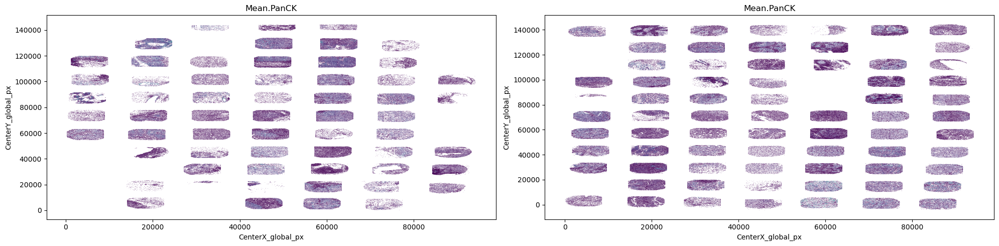

In [204]:
# Create 2 side-by-side subplots
fig, axs = plt.subplots(1, 2, figsize=(20, 5))  # 1 row, 4 columns

# Example: plotting the same object with different coloring (replace as needed)
sc.pl.scatter(
    block_1a,
    x="CenterX_global_px",
    y="CenterY_global_px",
    color="Mean.PanCK",
    size=0.45,
    ax=axs[0],
    show=False
)
sc.pl.scatter(
    block_2a,
    x="CenterX_global_px",
    y="CenterY_global_px",
    color="Mean.PanCK",
    size=0.45,
    ax=axs[1],
    show=False
)

# Remove colorbars
for ax in axs:
    ax.collections[0].colorbar.remove()

plt.tight_layout()
plt.show()


In [205]:
# Fix missasignment of some FOVs 

# Add new categories
block_1a.obs["Tissue_ID"] = block_1a.obs["Tissue_ID"].cat.add_categories(["26-A", "26-B", "36-A", "36-B"])

# FOV 201, 202, 203 and 204 to 26-A
mask = block_1a.obs["fov"].isin(["201", "202", "203", "204"])
block_1a.obs.loc[mask, "Tissue_ID"] = "26-A"

# FOV 205, 206, 207 and 208 to 26-B
mask = block_1a.obs["fov"].isin(["205", "206", "207", "208"])
block_1a.obs.loc[mask, "Tissue_ID"] = "26-B"

# FOV 189, 190, 200 and 201 to 36-A
mask = block_1a.obs["fov"].isin(["173", "174", "175", "176"])
block_1a.obs.loc[mask, "Tissue_ID"] = "36-A"

# FOV 173, 174, 175, 176 to 36-B
mask = block_1a.obs["fov"].isin(["189", "190", "200", "201"])
block_1a.obs.loc[mask, "Tissue_ID"] = "36-B"

# PREPROCESSING AND QC

In [206]:
# Grep negative probe and calculate QC metric. Block 1
block_1a.var["NegPrb"] = block_1a.var_names.str.startswith("NegPrb")
# Calculate QC metrics. Block 1
sc.pp.calculate_qc_metrics(block_1a, qc_vars=["NegPrb"], inplace=True)

# Grep negative probe and calculate QC metric. Block 2
block_2a.var["NegPrb"] = block_2a.var_names.str.startswith("NegPrb")
# Calculate QC metrics. Block 2
sc.pp.calculate_qc_metrics(block_2a, qc_vars=["NegPrb"], inplace=True)

<Axes: title={'center': 'Unique transcripts per cell'}, xlabel='n_genes_by_counts', ylabel='Count'>

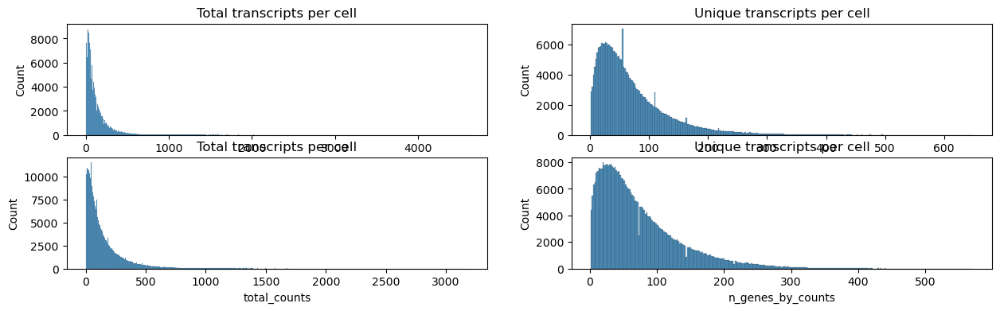

In [141]:
# Plotting transcripts and genes per sample
fig, axs = plt.subplots(2, 2, figsize=(15, 4))

axs[0, 0].set_title("Total transcripts per cell")
sns.histplot(
    block_1a.obs["total_counts"],
    kde=False,
    ax=axs[0, 0],
)

axs[0, 1].set_title("Unique transcripts per cell")
sns.histplot(
    block_1a.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[0, 1],
)

axs[1, 0].set_title("Total transcripts per cell")
sns.histplot(
    block_2a.obs["total_counts"],
    kde=False,
    ax=axs[1, 0],
)

axs[1, 1].set_title("Unique transcripts per cell")
sns.histplot(
    block_2a.obs["n_genes_by_counts"],
    kde=False,
    ax=axs[1, 1],
)

In [142]:
# Subset adata
block_1a_NegPrb = block_1a[:, block_1a.var["NegPrb"]]
block_1a_Expr = block_1a[:, block_1a.var["NegPrb"] == False]

block_2a_NegPrb = block_2a[:, block_2a.var["NegPrb"]]
block_2a_Expr = block_2a[:, block_2a.var["NegPrb"] == False]

In [145]:
# Extract raw counts
block_1a=block_1a_Expr.X.copy()
block_1a_Expr_raw=pd.DataFrame.sparse.from_spmatrix(block_1a)
block_1a_Expr_raw["Tissue_ID"] = block_1a_Expr.obs["Tissue_ID"].values
block_1a_Expr_raw=pd.melt(block_1a_Expr_raw, id_vars="Tissue_ID")

block_2a_Expr_raw=block_2a_Expr.X.copy()
block_2a_Expr_raw=pd.DataFrame.sparse.from_spmatrix(block_2a)
block_2a_Expr_raw["Tissue_ID"] = block_2a_Expr.obs["Tissue_ID"].values
block_2a_Expr_raw=pd.melt(block_2a_Expr_raw, id_vars="Tissue_ID")

AttributeError: 'AnnData' object has no attribute 'tocsc'

/var/folders/y6/k4cdb28d1qz56qw4jx2fxcxr0000gn/T/ipykernel_12920/763823523.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)


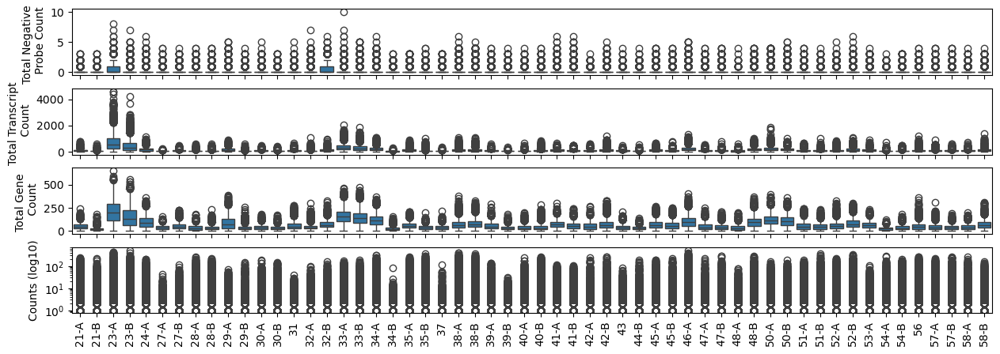

In [ ]:
# QC plots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, figsize=(15,5))

sns.boxplot(data=block_1a_NegPrb.obs, x="Tissue_ID", y="total_counts_NegPrb",ax=ax1)
ax1.set(xlabel="", ylabel="Total Negative \n Probe Count", xticklabels="")
#ax1.legend_.remove()

sns.boxplot(data=block_1a_Expr.obs, x="Tissue_ID", y="total_counts", ax=ax2)
ax2.set(xlabel="", ylabel="Total Transcript \n Count", xticklabels="")
#ax2.legend_.remove()

ax3 = sns.boxplot(data=block_1a_Expr.obs, x="Tissue_ID", y="n_genes_by_counts", ax=ax3)
ax3.set(xlabel="", ylabel="Total Gene \n Count", xticklabels="")
#ax3.legend_.remove()

ax4 = sns.boxplot(data = block_1a_Expr_raw, x = "Tissue_ID", y = "value", ax = ax4)
ax4.set(xlabel="", ylabel="Counts (log10)")
ax4.set_yscale("log", base=10)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)

plt.show()

/var/folders/y6/k4cdb28d1qz56qw4jx2fxcxr0000gn/T/ipykernel_12920/2682556014.py:19: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)


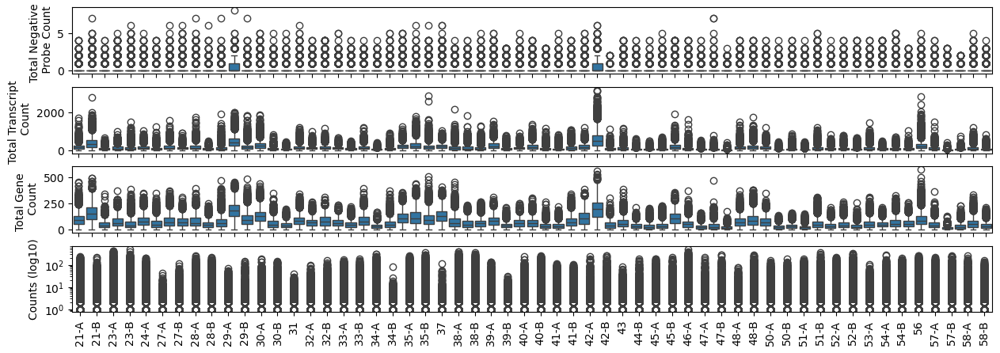

In [ ]:
# QC plots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, figsize=(15,5))

sns.boxplot(data=block_2a_NegPrb.obs, x="Tissue_ID", y="total_counts_NegPrb",ax=ax1)
ax1.set(xlabel="", ylabel="Total Negative \n Probe Count", xticklabels="")
#ax1.legend_.remove()

sns.boxplot(data=block_2a_Expr.obs, x="Tissue_ID", y="total_counts", ax=ax2)
ax2.set(xlabel="", ylabel="Total Transcript \n Count", xticklabels="")
#ax2.legend_.remove()

ax3 = sns.boxplot(data=block_2a_Expr.obs, x="Tissue_ID", y="n_genes_by_counts", ax=ax3)
ax3.set(xlabel="", ylabel="Total Gene \n Count", xticklabels="")
#ax3.legend_.remove()

ax4 = sns.boxplot(data = block_2a_Expr_raw, x = "Tissue_ID", y = "value", ax = ax4)
ax4.set(xlabel="", ylabel="Counts (log10)")
ax4.set_yscale("log", base=10)
ax4.set_xticklabels(ax4.get_xticklabels(), rotation=90)

plt.show()

In [210]:
# Clean
del block_1a_Expr_raw
del block_1a_NegPrb
gc.collect()

# Clean
del block_2a_Expr_raw
del block_2a_NegPrb
gc.collect()

1141

In [211]:
# Filter cells and trascripts. BLOCK 1
print("Pre-filtering:", block_1a_Expr.n_vars, "genes in", block_1a_Expr.n_obs, "cells")
sc.pp.filter_cells(block_1a_Expr, min_counts=30)
sc.pp.filter_cells(block_1a_Expr, min_genes=30)
print("Post-filtering:", block_1a_Expr.n_vars, "genes in", block_1a_Expr.n_obs, "cells")
gc.collect()


Pre-filtering: 1000 genes in 209916 cells
Post-filtering: 1000 genes in 209916 cells


785

In [212]:
# Filter cells and trascripts. BLOCK 2
print("Pre-filtering:", block_2a_Expr.n_vars, "genes in", block_2a_Expr.n_obs, "cells")
sc.pp.filter_cells(block_2a_Expr, min_counts=30)
sc.pp.filter_cells(block_2a_Expr, min_genes=30)
print("Post-filtering:", block_2a_Expr.n_vars, "genes in", block_2a_Expr.n_obs, "cells")
gc.collect()

Pre-filtering: 1000 genes in 298856 cells
Post-filtering: 1000 genes in 298856 cells


876

In [213]:
# Normalise and log transform
block_1a_Expr.layers["counts"] = block_1a_Expr.X.copy()
sc.pp.normalize_total(block_1a_Expr, inplace=True, target_sum=1e4)
sc.pp.log1p(block_1a_Expr)
gc.collect()

0

In [214]:
# Normalise and log transform
block_2a_Expr.layers["counts"] = block_2a_Expr.X.copy()
sc.pp.normalize_total(block_2a_Expr, inplace=True, target_sum=1e4)
sc.pp.log1p(block_2a_Expr)
gc.collect()

0

/Users/isasiain/miniconda3/envs/CosMx_2/lib/python3.11/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/Users/isasiain/miniconda3/envs/CosMx_2/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


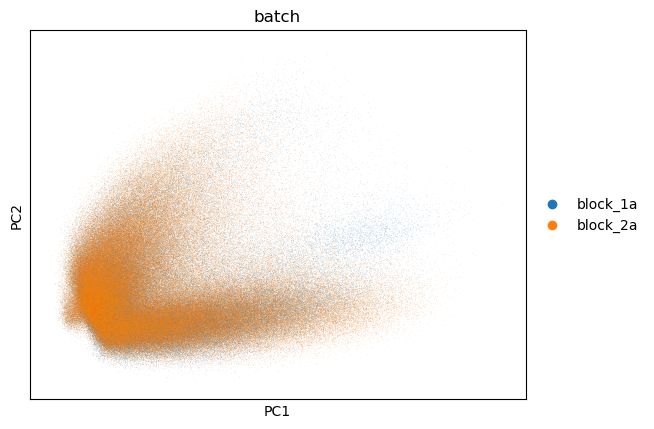

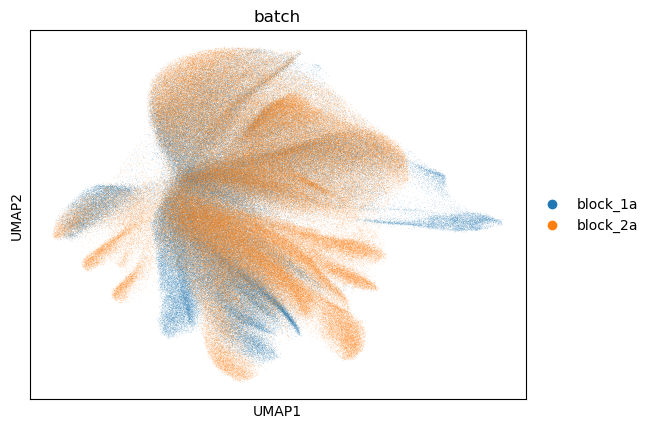

In [155]:
# Checking of there is batch effect between the two slided

# Add a batch label before concatenation
block_1a_Expr.obs["batch"] = "block_1a"
block_2a_Expr.obs["batch"] = "block_2a"

# Concatenate
adata_combined = ad.concat([block_1a_Expr, block_2a_Expr], join="inner", label="batch", keys=["block_1a", "block_2a"])

# Perform PCA
sc.pp.scale(adata_combined)  # optional, helps PCA if not already scaled
sc.tl.pca(adata_combined, svd_solver='arpack')

# Visualize UMAP
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata_combined)

sc.pl.pca(adata_combined, color="batch")
sc.pl.umap(adata_combined, color="batch")


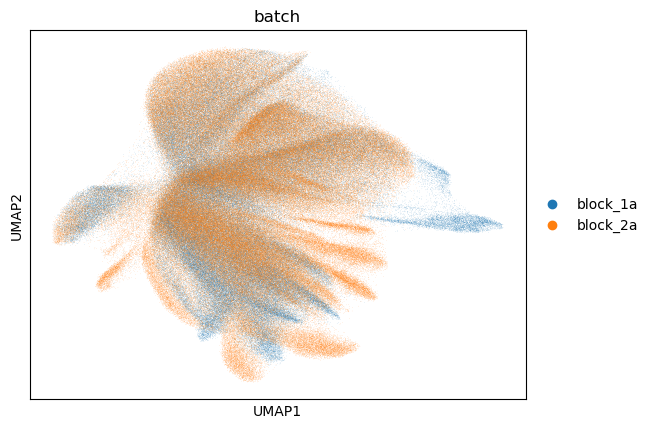

In [157]:
# Batch correct slides
sc.pp.combat(adata_combined, key='batch')

# Plotting PCA and UMAP
sc.pp.scale(adata_combined)  # scale after combat
sc.tl.pca(adata_combined, svd_solver='arpack')
sc.pp.neighbors(adata_combined, n_neighbors=15, n_pcs=20)
sc.tl.umap(adata_combined)

sc.pl.umap(adata_combined, color="batch")

# DEFINING TUMOUR/REST. Using Gaussian Mixture Modelling on Mean PAN-CK intensity

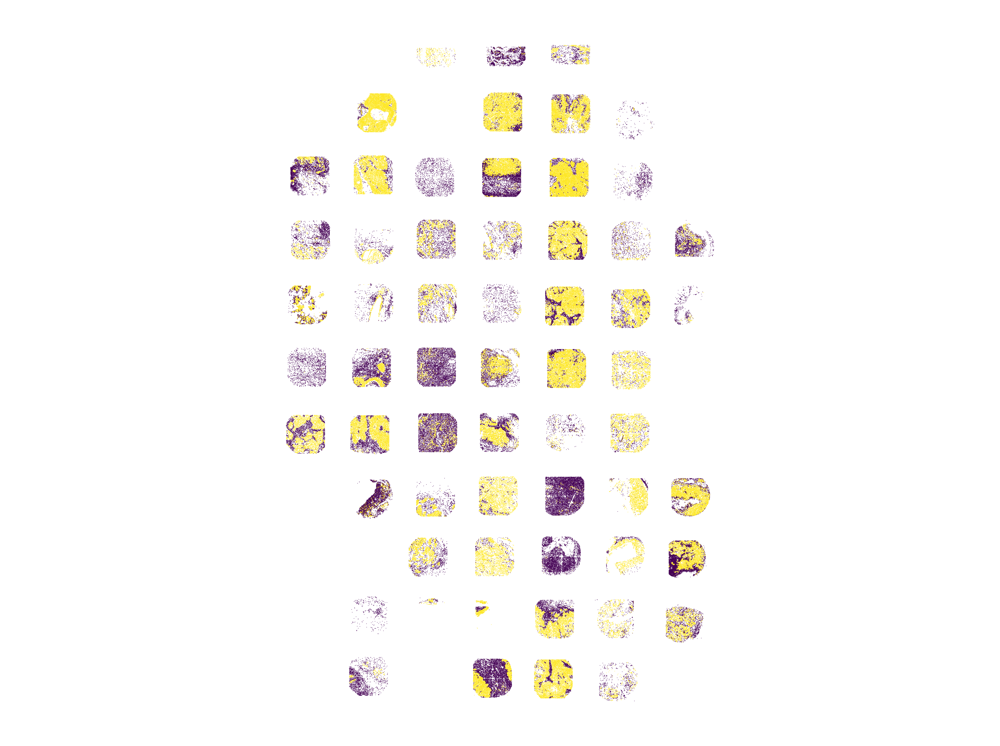

In [173]:
# BLOCK 1

# Get panck staining per cell
panck1 = block_1a_Expr.obs['Mean.PanCK']
panck1 = panck1.values.reshape(-1, 1)

# Run GMM
gmm = GaussianMixture(n_components=2)
gmm.fit(panck1)
label1 = gmm.predict(panck1)
prob1 = gmm.predict_proba(panck1)

# Plotting cluster assignments
plt.figure(dpi=1000)
plt.scatter(block_1a_Expr.obs["CenterX_global_px"], 
            block_1a_Expr.obs["CenterY_global_px"],
            c=label1,
            s=0.05, 
            linewidths=0, 
            marker='o')   
plt.axis('equal')  
plt.axis('off')   
plt.tight_layout() 
plt.show()

# Define which group is "Tumour" and which one "Rest"

# Create a new array to hold the string labels
label1_str = np.empty_like(label1, dtype=object)

# Store the data
if panck1[label1 == 0].mean() > panck1[label1 == 1].mean():
    label1_str[label1 == 0] = "Tumour"
    label1_str[label1 == 1] = "Rest"
else:
    label1_str[label1 == 0] = "Rest"
    label1_str[label1 == 1] = "Tumour"


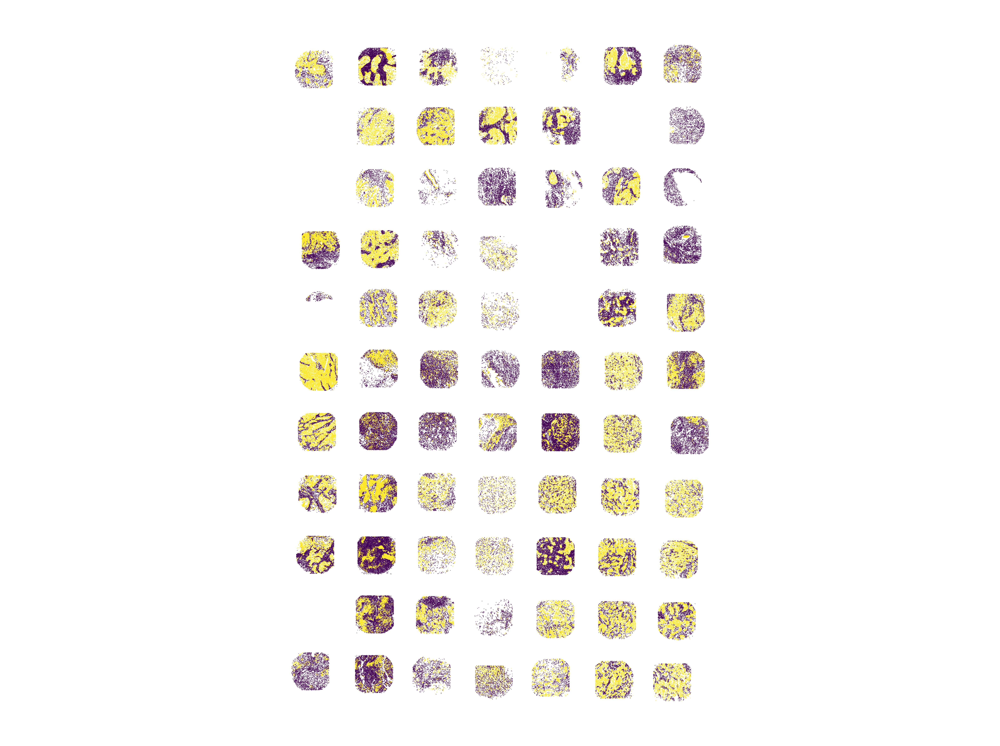

In [174]:
# BLOCK 2

# Get panck staining per cell
panck2 = block_2a_Expr.obs['Mean.PanCK']
panck2 = panck2.values.reshape(-1, 1)

# Run GMM
gmm = GaussianMixture(n_components=2)
gmm.fit(panck2)
label2 = gmm.predict(panck2)
prob2 = gmm.predict_proba(panck2)

# Plotting cluster assignments
plt.figure(dpi=1000)
plt.scatter(block_2a_Expr.obs["CenterX_global_px"], 
            block_2a_Expr.obs["CenterY_global_px"],
            c=label2,
            s=0.05, 
            linewidths=0, 
            marker='o')   
plt.axis('equal')  
plt.axis('off')   
plt.tight_layout() 
plt.show()

# Define which group is "Tumour" and which one "Rest"

# Create a new array to hold the string labels
label2_str = np.empty_like(label2, dtype=object)

# Store the data
if panck2[label2 == 0].mean() > panck2[label2 == 1].mean():
    label2_str[label2 == 0] = "Tumour"
    label2_str[label2 == 1] = "Rest"
else:
    label2_str[label2 == 0] = "Rest"
    label2_str[label2 == 1] = "Tumour"

In [178]:
# Store labels in the concatenated data
adata_combined.obs["Cell_Type"] = np.concatenate((label1_str, label2_str))

In [188]:
# Store labels
block_1a_Expr.obs['GMM_Label'] = label1
block_2a_Expr.obs['GMM_Label'] = label2

# Get gene counts for OAS2, BRCA1, and SMO
for gene in ['OAS2', 'BRCA1', 'SMO', 'GSTP1']:
    block_1a_Expr.obs[f'{gene}_Count'] = block_1a_Expr[:, gene].X.toarray().flatten()
    block_2a_Expr.obs[f'{gene}_Count'] = block_2a_Expr[:, gene].X.toarray().flatten()

# Build and save dataframes for each block
df1 = block_1a_Expr.obs[['Tissue_ID', 'GMM_Label', 'Mean.PanCK', 'OAS2_Count', 'BRCA1_Count', 'SMO_Count', 'GSTP1_Count']].copy()
df1.to_csv('/Users/isasiain/PhD/Projects/project_3/data/block1a_OAS2_in_tumour.csv', index=False)

df2 = block_2a_Expr.obs[['Tissue_ID', 'GMM_Label', 'Mean.PanCK', 'OAS2_Count', 'BRCA1_Count', 'SMO_Count', 'GSTP1_Count']].copy()
df2.to_csv('/Users/isasiain/PhD/Projects/project_3/data/block2a_OAS2_in_tumour.csv', index=False)

In [ ]:
# Store labels

# Get OAS2 counts
oas2_counts = adata_combined[:, 'OAS2'].X
oas2_counts = oas2_counts.toarray().flatten()

adata_combined.obs['OAS2_Count'] = oas2_counts

brca1_counts = adata_combined[:, 'BRCA1'].X
brca1_counts = brca1_counts.toarray().flatten()

adata_combined.obs['BRCA1_Count'] = brca1_counts

smo_counts = adata_combined[:, 'SMO'].X
smo_counts = smo_counts.toarray().flatten()

adata_combined.obs['SMO_Count'] = smo_counts

gstp1_counts = adata_combined[:, 'GSTP1'].X
gstp1_counts = gtsp1_counts.toarray().flatten()

adata_combined.obs['GSTP1_Count'] = gstp1_counts


# Build and save dataframes
df = adata_combined.obs[['Tissue_ID', 'Cell_Type', 'Mean.PanCK', 'OAS2_Count', 'BRCA1_Count', 'SMO_Count', 'GSTP1_Count', 'FOXC1_Count', "batch"]].copy()
df.to_csv('/Users/isasiain/PhD/Projects/project_3/data/block12_OAS2_in_tumour.csv', index=False)

AttributeError: 'numpy.ndarray' object has no attribute 'toarray'